# Calibrated Explanations
## Comparison with LIME

Author: Tuwe Löfström (tuwe.lofstrom@ju.se)  
Copyright 2023 Tuwe Löfström  
License: BSD 3 clause
Sources:
1. [Wine Quality [uci]](https://archive.ics.uci.edu/ml/datasets/wine+quality)
2. [California Housing data set [kaggle]](https://www.kaggle.com/datasets/camnugent/california-housing-prices)

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from lime.lime_tabular import LimeTabularExplainer
from sklearn.datasets import fetch_openml
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.model_selection import train_test_split

from calibrated_explanations import CalibratedExplainer, __version__

print(f"calibrated_explanations {__version__}")

calibrated_explanations v0.9.0


# Classification

In [3]:
dataset = fetch_openml(name="wine", version=7, as_frame=True)

X = dataset.data.values.astype(float)
y = (dataset.target.values == "True").astype(int)

feature_names = dataset.feature_names

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=2, stratify=y)

X_prop_train, X_cal, y_prop_train, y_cal = train_test_split(X_train, y_train, test_size=0.25)

In [4]:
rf = RandomForestClassifier(n_jobs=-1)

rf.fit(X_prop_train, y_prop_train)

RandomForestClassifier(n_jobs=-1)

In [5]:
cal_expl = CalibratedExplainer(rf, X_cal, y_cal, feature_names=feature_names, mode="classification")
display(cal_expl)

CalibratedExplainer(mode=classification, learner=RandomForestClassifier(n_jobs=-1))

In [6]:
factual_explanations_cl = cal_expl.explain_factual(X_test)
ce_as_lime_cl = factual_explanations_cl.as_lime()

In [7]:
lime_expl = LimeTabularExplainer(X_cal, feature_names=feature_names)
lime_exps_cl = []
for instance in X_test:
    exp = lime_expl.explain_instance(instance, rf.predict_proba)
    lime_exps_cl.append(exp)

Instance 0: LIME Explanation


Instance 0: Calibrated Explanation


C:\Users\loftuw\CUDATemp\ipykernel_68324\2589822047.py:5: DeprecationWarning: This method is deprecated and may be removed in future versions. Use indexing instead.
  factual_explanations_cl.get_explanation(i).plot()


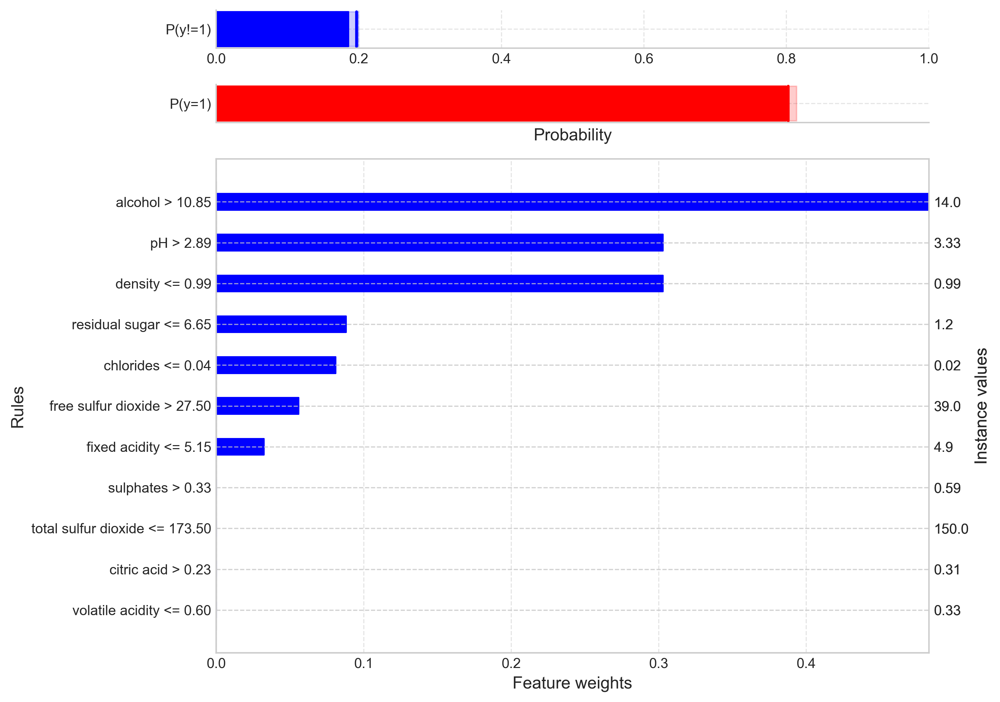

C:\Users\loftuw\CUDATemp\ipykernel_68324\2589822047.py:6: DeprecationWarning: This method is deprecated and may be removed in future versions. Use indexing instead.
  factual_explanations_cl.get_explanation(i).plot(uncertainty=True)


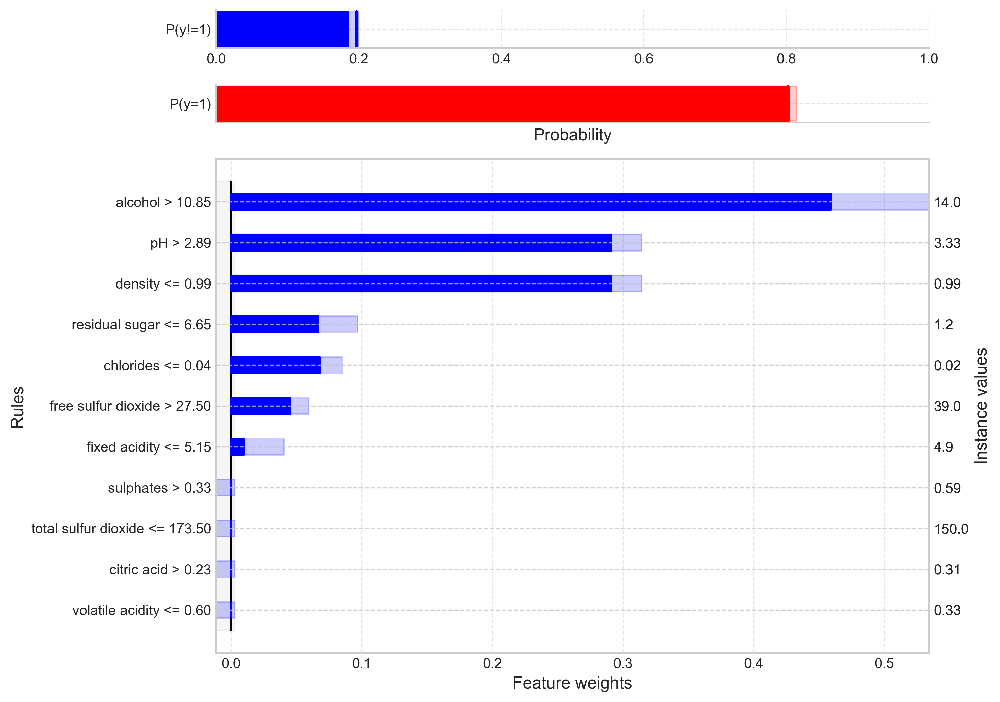

Instance 1: LIME Explanation


Instance 1: Calibrated Explanation


C:\Users\loftuw\CUDATemp\ipykernel_68324\2589822047.py:5: DeprecationWarning: This method is deprecated and may be removed in future versions. Use indexing instead.
  factual_explanations_cl.get_explanation(i).plot()


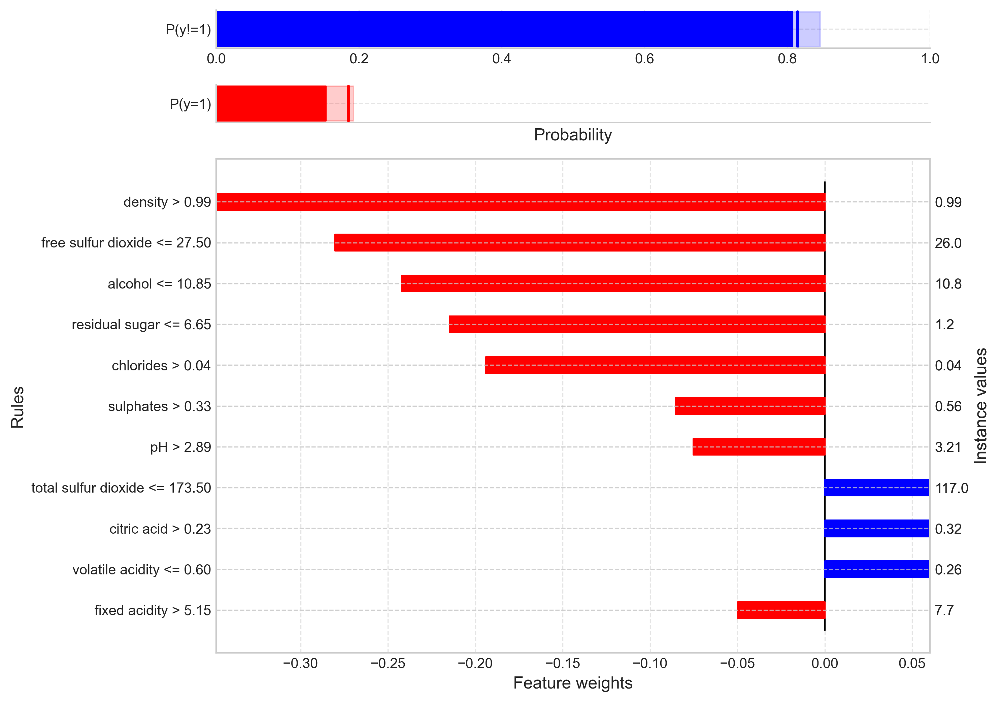

C:\Users\loftuw\CUDATemp\ipykernel_68324\2589822047.py:6: DeprecationWarning: This method is deprecated and may be removed in future versions. Use indexing instead.
  factual_explanations_cl.get_explanation(i).plot(uncertainty=True)


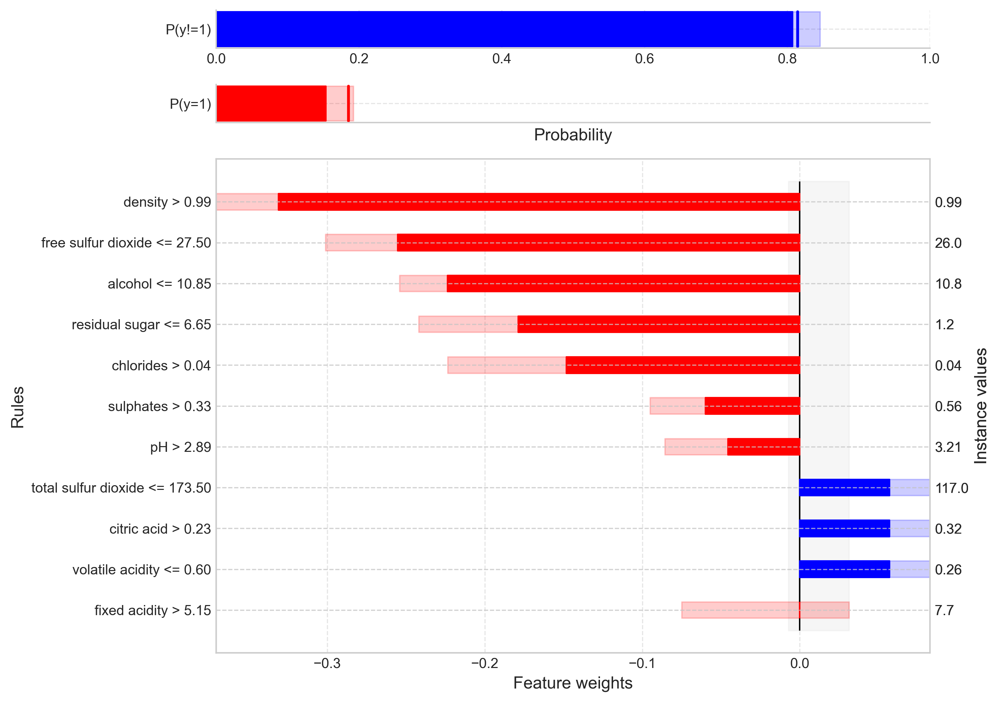

In [8]:
for i, (ce, lime) in enumerate(zip(ce_as_lime_cl, lime_exps_cl)):
    print(f"Instance {i}: LIME Explanation")
    lime.show_in_notebook(show_table=True)
    print(f"Instance {i}: Calibrated Explanation")
    factual_explanations_cl.get_explanation(i).plot()
    factual_explanations_cl.get_explanation(i).plot(uncertainty=True)
    ce.show_in_notebook(show_table=True)

# Regression

In [9]:
dataset = fetch_openml(name="house_sales", version=3)

X = dataset.data.values.astype(float)
y = dataset.target.values
filter_idx = y <= 500000
X = X[filter_idx, :]
y = y[filter_idx]
y = y / 1000

feature_names = dataset.feature_names

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=2, random_state=42)

X_prop_train, X_cal, y_prop_train, y_cal = train_test_split(X_train, y_train, test_size=0.25)

Let us split the data set into a training and a test set, and further split the training set into a proper training set and a calibration set. Let us fit a random forest to the proper training set. We also set a random seed to be able to rerun the notebook and get the same results.

In [10]:
rf = RandomForestRegressor(n_estimators=100, oob_score=True)

rf.fit(X_prop_train, y_prop_train)

RandomForestRegressor(oob_score=True)

In [11]:
cal_expl = CalibratedExplainer(rf, X_cal, y_cal, feature_names=feature_names, mode="regression")
display(cal_expl)

CalibratedExplainer(mode=regression, learner=RandomForestRegressor(oob_score=True), difficulty_estimator=None)

In [12]:
factual_explanations_reg = cal_expl.explain_factual(X_test, low_high_percentiles=(5, 95))
ce_as_lime_reg = factual_explanations_reg.as_lime(num_features_to_show=10)

In [13]:
lime_expl = LimeTabularExplainer(X_cal, feature_names=feature_names, mode="regression")
lime_exps_reg = []
for instance in X_test:
    exp = lime_expl.explain_instance(instance, rf.predict)
    lime_exps_reg.append(exp)

Instance 0: LIME Explanation


Instance 0: Calibrated Explanation


C:\Users\loftuw\CUDATemp\ipykernel_68324\1793732359.py:5: DeprecationWarning: This method is deprecated and may be removed in future versions. Use indexing instead.
  factual_explanations_reg.get_explanation(i).plot()


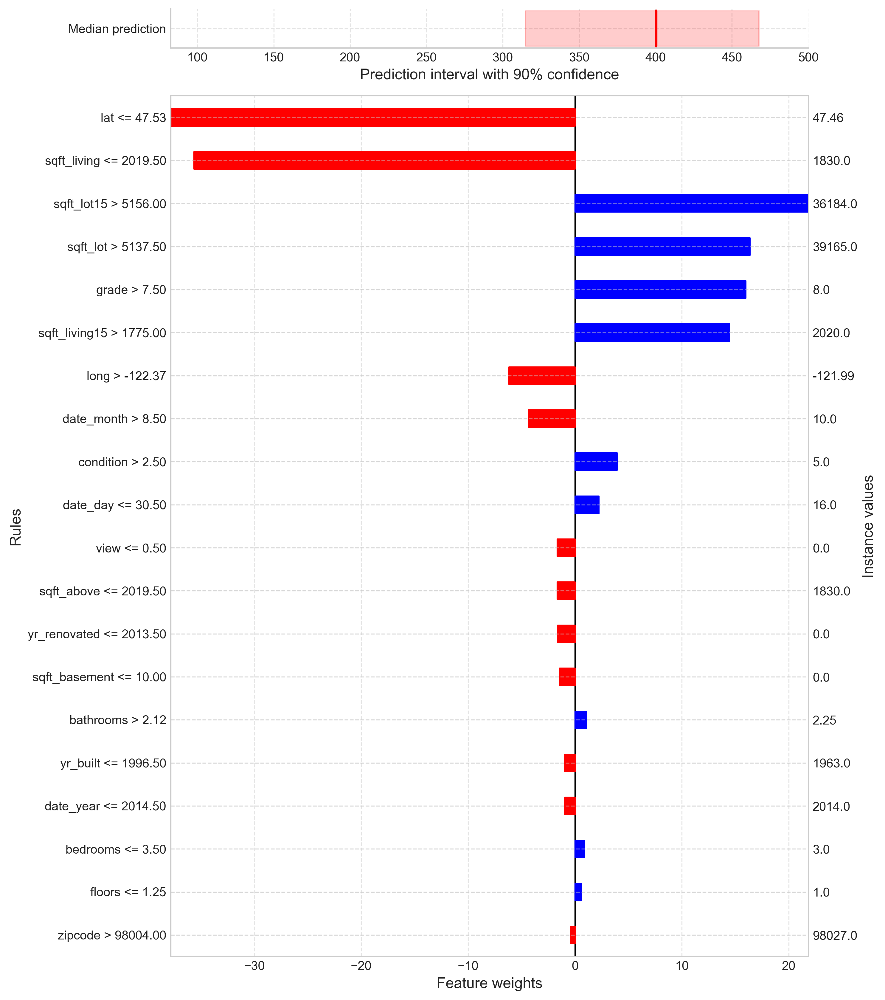

C:\Users\loftuw\CUDATemp\ipykernel_68324\1793732359.py:6: DeprecationWarning: This method is deprecated and may be removed in future versions. Use indexing instead.
  factual_explanations_reg.get_explanation(i).plot(uncertainty=True)


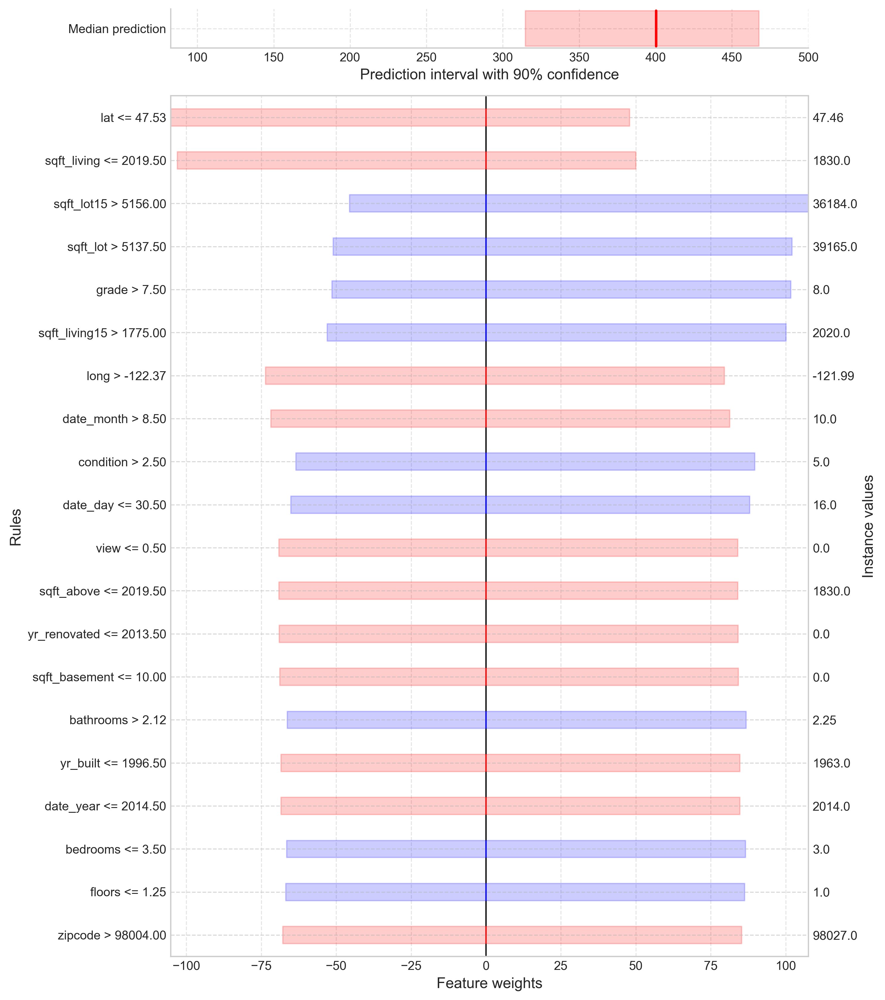

Instance 1: LIME Explanation


Instance 1: Calibrated Explanation


C:\Users\loftuw\CUDATemp\ipykernel_68324\1793732359.py:5: DeprecationWarning: This method is deprecated and may be removed in future versions. Use indexing instead.
  factual_explanations_reg.get_explanation(i).plot()


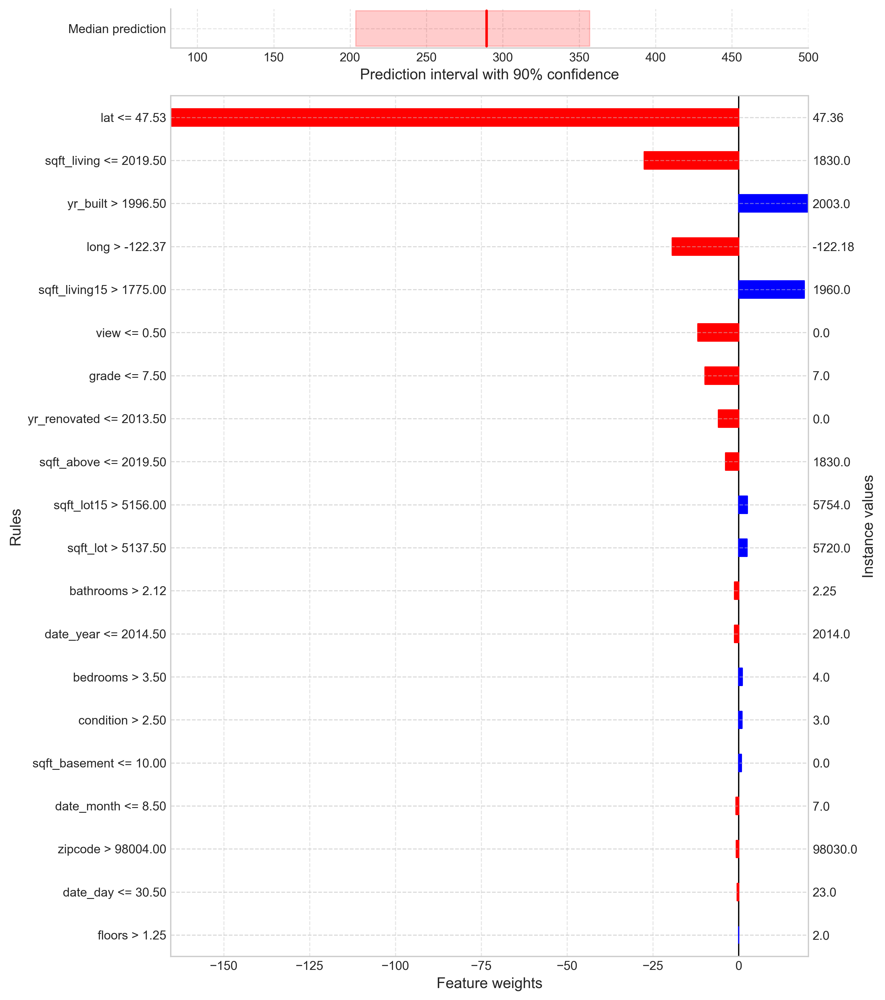

C:\Users\loftuw\CUDATemp\ipykernel_68324\1793732359.py:6: DeprecationWarning: This method is deprecated and may be removed in future versions. Use indexing instead.
  factual_explanations_reg.get_explanation(i).plot(uncertainty=True)


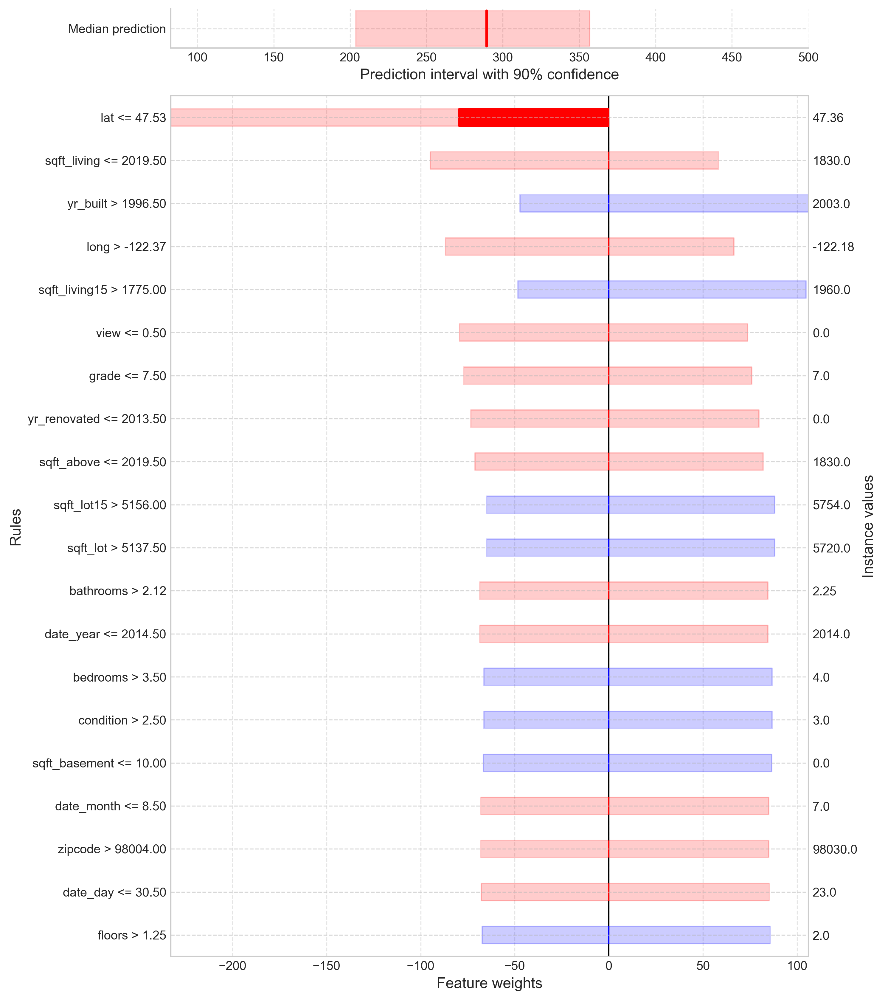

In [14]:
for i, (ce, lime) in enumerate(zip(ce_as_lime_reg, lime_exps_reg)):
    print(f"Instance {i}: LIME Explanation")
    lime.show_in_notebook(show_table=True)
    print(f"Instance {i}: Calibrated Explanation")
    factual_explanations_reg.get_explanation(i).plot()
    factual_explanations_reg.get_explanation(i).plot(uncertainty=True)
    ce.show_in_notebook(show_table=True)